# Snapshot-based horizontal grid-resolution flow agreement


In [10]:
# ============================================================
# 1. IMPORTS AND PROJECT PATHS
# ============================================================

from pathlib import Path
import sys
import json
import importlib
import warnings
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgb

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

from scipy.stats import wasserstein_distance

NB_DIR = Path.cwd().resolve()
PROJECT_DIR = NB_DIR.parent.parent
FLOW_DIR = PROJECT_DIR / "z.flow_postprocessing"
FLOW_SCRIPTS_DIR = FLOW_DIR / "scripts"

for path in [PROJECT_DIR, FLOW_SCRIPTS_DIR]:
    path = str(path)
    if path not in sys.path:
        sys.path.insert(0, path)

import theme.plot_theme as ptheme
import shcherbina_utils as shu

importlib.reload(ptheme)
ptheme.apply_theme()

importlib.reload(shu)
shu.apply_plot_style()

print(f"Notebook dir     : {NB_DIR}")
print(f"Project dir      : {PROJECT_DIR}")
print(f"Flow scripts dir : {FLOW_SCRIPTS_DIR}")
print(f"Utilities        : {Path(shu.__file__).resolve()}")


Notebook dir     : C:\Users\Jelle Gortemaker\Documents\Thesis\z.flow_postprocessing\notebooks
Project dir      : C:\Users\Jelle Gortemaker\Documents\Thesis
Flow scripts dir : C:\Users\Jelle Gortemaker\Documents\Thesis\z.flow_postprocessing\scripts
Utilities        : C:\Users\Jelle Gortemaker\Documents\Thesis\z.flow_postprocessing\scripts\shcherbina_utils.py


In [11]:
# ============================================================
# 2. CASE AND SNAPSHOT SETTINGS
# ============================================================

# Select the two 3D simulations you want to compare.
# Grid spacing is read automatically from the X/Y coordinates in each NetCDF file.
CASE_REFERENCE = "run_feb1_v42_d2000"
CASE_COMPARISON = "run_feb1"
RUN_TITLE_INFO = "Case FEB-1-V42-d2000"

# ##################
# # CHANGE THESE TO CHANGE THE LABELS! TO PLOT THE GRID RESOLUTION, CRTL F
label_3d = f"V42-d2000"
label_2d = f"V84"
# ###################

INPUT_DIR = (NB_DIR / "../data/input").resolve()
RESULTS_ROOT = (NB_DIR / "../results").resolve()

DATA_FILE_REFERENCE = INPUT_DIR / f"{CASE_REFERENCE}.nc"
DATA_FILE_COMPARISON = INPUT_DIR / f"{CASE_COMPARISON}.nc"


CASE_3D = CASE_REFERENCE
CASE_2D = CASE_COMPARISON
DATA_FILE_3D = DATA_FILE_REFERENCE
DATA_FILE_2D = DATA_FILE_COMPARISON

SNAPSHOT_OBS_SELECTIONS = np.array([0, 3, 7, 13]) * 8

DAY_PER_INDEX_3D = 3.0 / 24.0
DAY_PER_INDEX_2D = 3.0 / 24.0

REFERENCE_START_INDEX_3D = None
REFERENCE_START_INDEX_2D = None
DEFAULT_REFERENCE_START_INDEX = 0

LEVEL_INDICES_3D = (0,)
LEVEL_INDICES_2D = (0,)

# Leave as None to infer grid spacing from the NetCDF X/Y coordinates.
DX_3D = None
DY_3D = None
DX_2D = None
DY_2D = None

F0 = 8.0e-5
ACTIVE_RO_THRESHOLD = 0.5
MAX_DISTRIBUTION_SAMPLES = 150_000

NBINS_PDF = 80
NBINS_JPDF = 100
PDF_PERCENTILE_LIMITS = (0.01, 99.99)

SAVE_OUTPUTS = True
SAVE_FIGURES = True

MAKE_SELECTED_CASE_MAPS = True
MAKE_SELECTED_CASE_JPDFS = True
MAKE_SELECTED_CASE_PDF_EVOLUTION = True

CASE_RESULTS_DIR = RESULTS_ROOT / CASE_REFERENCE
METRICS_DIR = CASE_RESULTS_DIR / "metrics"
FIG_DIR = CASE_RESULTS_DIR / "figures" / "variable_discretization_comparison"
MAP_DIR = FIG_DIR / "map_panels"
JPDF_DIR = FIG_DIR / "jpdf_panels"
PDF_EVOLUTION_DIR = FIG_DIR / "pdf_evolution"

if SAVE_OUTPUTS:
    METRICS_DIR.mkdir(parents=True, exist_ok=True)

if SAVE_FIGURES:
    FIG_DIR.mkdir(parents=True, exist_ok=True)
    MAP_DIR.mkdir(parents=True, exist_ok=True)
    JPDF_DIR.mkdir(parents=True, exist_ok=True)
    PDF_EVOLUTION_DIR.mkdir(parents=True, exist_ok=True)

print(f"Reference input          : {DATA_FILE_REFERENCE}")
print(f"Comparison input         : {DATA_FILE_COMPARISON}")
print(f"RUN_TITLE_INFO           : {RUN_TITLE_INFO}")
print(f"SNAPSHOT_OBS_SELECTIONS  : {SNAPSHOT_OBS_SELECTIONS}")
print(f"Case results dir         : {CASE_RESULTS_DIR}")


Reference input          : C:\Users\Jelle Gortemaker\Documents\Thesis\z.flow_postprocessing\data\input\run_feb1_v42_d2000.nc
Comparison input         : C:\Users\Jelle Gortemaker\Documents\Thesis\z.flow_postprocessing\data\input\run_feb1.nc
RUN_TITLE_INFO           : Case FEB-1-V42-d2000
SNAPSHOT_OBS_SELECTIONS  : [  0  24  56 104]
Case results dir         : C:\Users\Jelle Gortemaker\Documents\Thesis\z.flow_postprocessing\results\run_feb1_v42_d2000


In [12]:
# ============================================================
# 3. HELPERS
# ============================================================

def apply_comparison_style():

    font_size = max(getattr(ptheme, "FONT_SIZE", 14), 20)
    title_size = max(getattr(ptheme, "TITLE_SIZE", font_size + 2), 26)
    label_size = max(getattr(ptheme, "LABEL_SIZE", font_size), 24)
    tick_size = max(getattr(ptheme, "TICK_SIZE", font_size - 2), 21)
    legend_size = max(getattr(ptheme, "LEGEND_SIZE", font_size - 1), 20)
    annotation_size = max(getattr(ptheme, "ANNOTATION_SIZE", font_size - 2), 19)
    suptitle_size = max(getattr(ptheme, "SUPTITLE_SIZE", title_size + 2), 30)

    plt.rcParams.update({
        "font.size": font_size,
        "axes.titlesize": title_size,
        "axes.labelsize": label_size,
        "xtick.labelsize": tick_size,
        "ytick.labelsize": tick_size,
        "legend.fontsize": legend_size,
        "figure.titlesize": suptitle_size,
    })

    return {
        "font": font_size,
        "title": title_size,
        "label": label_size,
        "tick": tick_size,
        "legend": legend_size,
        "annotation": annotation_size,
        "suptitle": suptitle_size,
    }


PLOT_SIZES = apply_comparison_style()



def enforce_axis_text_sizes(ax):
    """Re-apply A4-readable text sizes after helper functions modify an axis."""
    ax.title.set_fontsize(PLOT_SIZES["title"])
    ax.xaxis.label.set_fontsize(PLOT_SIZES["label"])
    ax.yaxis.label.set_fontsize(PLOT_SIZES["label"])
    ax.tick_params(
        axis="both",
        which="major",
        labelsize=PLOT_SIZES["tick"],
    )


def enforce_colorbar_text_sizes(colorbar):
    """Apply the same readable scale to colorbar labels and ticks."""
    colorbar.ax.tick_params(labelsize=PLOT_SIZES["tick"])
    colorbar.ax.yaxis.label.set_size(PLOT_SIZES["label"])


TOC_BLUE = getattr(
    ptheme,
    "TOC_blue",
    getattr(ptheme, "TOC_BLUE", shu.get_color("default")),
)


def newest_collection_config(case_name):
    metadata_dir = RESULTS_ROOT / case_name / "metadata"
    candidates = sorted(
        metadata_dir.glob("*_config.json"),
        key=lambda path: path.stat().st_mtime,
    )
    if not candidates:
        return None
    return candidates[-1]


def optional_case_config(case_name):
    config_path = newest_collection_config(case_name)

    if config_path is None:
        return {}

    try:
        with config_path.open("r", encoding="utf-8") as file:
            config = json.load(file)
    except (OSError, json.JSONDecodeError) as error:
        warnings.warn(
            f"Could not read {config_path}: {error}. "
            "The fallback reference index will be used."
        )
        return {}

    config["_config_path"] = str(config_path)
    return config


def resolve_reference_index(config, manual_index):
    if manual_index is not None:
        return int(manual_index)
    return int(config.get("release_time_index", DEFAULT_REFERENCE_START_INDEX))


def elapsed_days(n_times, day_per_index, reference_start_index):
    return (
        np.arange(int(n_times), dtype=float) - int(reference_start_index)
    ) * float(day_per_index)


def snapshot_records_from_obs_indices(time_days, obs_indices):
    time_days = np.asarray(time_days, dtype=float)
    obs_indices = np.asarray(obs_indices, dtype=int)

    if np.any(obs_indices < 0) or np.any(obs_indices >= time_days.size):
        raise IndexError(
            "At least one value in SNAPSHOT_OBS_SELECTIONS is outside the available time range."
        )

    records = []
    for obs_index in obs_indices:
        records.append(
            {
                "obs_index": int(obs_index),
                "actual_day": float(time_days[int(obs_index)]),
            }
        )
    return records


def infer_grid_spacing(ds, coordinate_name, fallback=None):
    if coordinate_name in ds.coords:
        coordinate = np.asarray(ds[coordinate_name].values, dtype=float)
        if coordinate.size > 1:
            spacing = float(np.nanmedian(np.abs(np.diff(coordinate))))
            if np.isfinite(spacing) and spacing > 0.0:
                return spacing

    if fallback is not None:
        return float(fallback)

    raise ValueError(f"Could not infer grid spacing from {coordinate_name}.")


def dataset_layout(ds):
    time_dim = shu.find_dim(ds["UVEL"].dims, ["T", "time", "iter"])
    z_dim = shu.find_dim(ds["UVEL"].dims, ["Z", "Zmd", "k", "depth"])
    return time_dim, z_dim


def calculate_kinematics(ds, time_dim, z_dim, time_index, level_indices, dx, dy):
    ro, div_f, strain_f = shu.compute_surface_kinematics(
        ds,
        time_dim=time_dim,
        z_dim=z_dim,
        it=int(time_index),
        levels=list(level_indices),
        dx=float(dx),
        dy=float(dy),
        f0=float(F0),
    )
    return {
        "ro": np.asarray(ro, dtype=float),
        "div_f": np.asarray(div_f, dtype=float),
        "strain_f": np.asarray(strain_f, dtype=float),
    }


def full_domain_active_fraction(ro, threshold=ACTIVE_RO_THRESHOLD):
    ro = np.asarray(ro, dtype=float)
    ny, nx = ro.shape
    full_domain = [{"square_id": 1, "x0": 0, "x1": nx, "y0": 0, "y1": ny}]
    result = shu.compute_pro_per_square(ro, full_domain, threshold)
    return float(result[0]["PRo"])


def deterministic_subsample(values, max_samples):
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    if max_samples is None or values.size <= int(max_samples):
        return values
    step = int(np.ceil(values.size / int(max_samples)))
    return values[::step]


def distribution_distance(values_2d, values_3d, max_samples=MAX_DISTRIBUTION_SAMPLES):
    values_2d = deterministic_subsample(values_2d, max_samples)
    values_3d = deterministic_subsample(values_3d, max_samples)

    if values_2d.size == 0 or values_3d.size == 0:
        return np.nan, np.nan

    raw = float(wasserstein_distance(values_2d, values_3d))
    q25, q75 = np.nanpercentile(values_3d, [25.0, 75.0])
    iqr_3d = float(q75 - q25)
    normalized = raw / iqr_3d if np.isfinite(iqr_3d) and iqr_3d > 0.0 else np.nan
    return raw, normalized


def divergence_rms_3d(div_f):
    """
    Root-mean-square of the normalized horizontal divergence field.

    Here div_f is the full 2D field of delta/f at one snapshot. The returned
    metric is:
        sqrt( mean( (delta/f)^2 ) )
    over all finite grid cells.

    Interpretation:
    - larger values indicate a stronger domain-wide amplitude of horizontal
      convergence/divergence,
    - smaller values indicate a more weakly divergent, closer-to-nondivergent
      surface flow.

    Because the 2D reduced model cannot explicitly represent the same 3D
    ageostrophic divergence processes, this is used here as a 3D-only context
    metric rather than as a direct 2D--3D agreement measure.
    """
    div_f = np.asarray(div_f, dtype=float)
    finite = np.isfinite(div_f)
    if not np.any(finite):
        return np.nan
    return float(np.sqrt(np.nanmean(div_f[finite] ** 2)))


def common_pdf_edges(arrays, n_bins=NBINS_PDF, percentile_limits=PDF_PERCENTILE_LIMITS, lower_bound=None):
    finite_arrays = []
    for values in arrays:
        values = np.asarray(values, dtype=float)
        values = values[np.isfinite(values)]
        if values.size:
            finite_arrays.append(values)
    if not finite_arrays:
        raise ValueError("No finite values are available for PDF binning.")

    combined = np.concatenate(finite_arrays)
    lower, upper = np.nanpercentile(combined, percentile_limits)
    if lower_bound is not None:
        lower = max(float(lower_bound), float(lower))
    if upper <= lower:
        upper = lower + 1.0
    padding = 0.03 * (upper - lower)
    lower_edge = (lower - padding) if lower_bound is None else max(float(lower_bound), lower - padding)
    upper_edge = upper + padding
    return np.linspace(lower_edge, upper_edge, int(n_bins) + 1)


def common_jpdf_edges(ro_3d, strain_3d, ro_2d, strain_2d, n_bins=NBINS_JPDF):
    ro_all = np.concatenate([
        np.asarray(ro_3d, dtype=float).ravel(),
        np.asarray(ro_2d, dtype=float).ravel(),
    ])
    strain_all = np.concatenate([
        np.asarray(strain_3d, dtype=float).ravel(),
        np.asarray(strain_2d, dtype=float).ravel(),
    ])

    ro_all = ro_all[np.isfinite(ro_all)]
    strain_all = strain_all[np.isfinite(strain_all)]

    # Use the complete finite data range so no valid grid-cell values
    # are excluded from the JPDF.
    xlow, xhigh = np.nanmin(ro_all), np.nanmax(ro_all)
    ylow, yhigh = np.nanmin(strain_all), np.nanmax(strain_all)

    xspan = max(xhigh - xlow, np.finfo(float).eps)
    yspan = max(yhigh - ylow, np.finfo(float).eps)

    xpad = 0.02 * xspan
    ypad = 0.02 * yspan

    x_edges = np.linspace(xlow - xpad, xhigh + xpad, n_bins + 1)
    y_edges = np.linspace(max(0.0, ylow - ypad), yhigh + ypad, n_bins + 1)
    return x_edges, y_edges


def regime_fractions(ro, strain):
    ro = np.asarray(ro, dtype=float)
    strain = np.asarray(strain, dtype=float)
    mask = np.isfinite(ro) & np.isfinite(strain)
    if not np.any(mask):
        return {"AVD": np.nan, "SD": np.nan, "CVD": np.nan}
    ro = ro[mask]
    strain = strain[mask]
    avd = (ro < 0.0) & (np.abs(ro) > strain)
    cvd = (ro > 0.0) & (np.abs(ro) > strain)
    sd = ~(avd | cvd)
    total = float(ro.size)
    return {"AVD": np.sum(avd) / total, "SD": np.sum(sd) / total, "CVD": np.sum(cvd) / total}


def safe_filename_day(day):
    return f"{float(day):g}".replace("-", "m").replace(".", "p")


def lighten_color(color, amount):
    """Mix color with white. amount=0 returns original; amount=1 returns white."""
    rgb = np.array(to_rgb(color))
    return tuple((1 - amount) * rgb + amount * np.ones(3))



In [13]:
# ============================================================
# 4. COMBINED PANEL PLOTTING HELPERS
# ============================================================

def plot_side_by_side_field_panel(
    field_3d,
    field_2d,
    dx_3d,
    dy_3d,
    dx_2d,
    dy_2d,
    title_left,
    title_right,
    suptitle,
    cbar_label,
    cmap,
    vmin,
    vmax,
    output_path=None,
):
    apply_comparison_style()

    if isinstance(cmap, str):
        cmap = shu.get_cmap(cmap)

    field_3d = np.asarray(field_3d, dtype=float)
    field_2d = np.asarray(field_2d, dtype=float)

    fig = plt.figure(figsize=(14.2, 7.0), facecolor="white")
    ax_left = fig.add_axes([0.050, 0.110, 0.385, 0.770])
    ax_right = fig.add_axes([0.452, 0.110, 0.385, 0.770])
    cax = fig.add_axes([0.860, 0.110, 0.024, 0.770])

    pcm = None

    for index, (ax, field, dx, dy, title) in enumerate(
        zip(
            [ax_left, ax_right],
            [field_3d, field_2d],
            [dx_3d, dx_2d],
            [dy_3d, dy_2d],
            [title_left, title_right],
        )
    ):
        ny, nx = field.shape
        x_edges = np.arange(nx + 1) * dx / 1000.0
        y_edges = np.arange(ny + 1) * dy / 1000.0

        ax.set_facecolor("white")
        pcm = ax.pcolormesh(
            x_edges,
            y_edges,
            field,
            shading="flat",
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
        )

        shu.format_axis(
            ax,
            title=title,
            xlabel="x [km]",
            ylabel="y [km]" if index == 0 else None,
            grid=True,
            equal=True,
        )
        enforce_axis_text_sizes(ax)

    ax_right.tick_params(axis="y", labelleft=False)

    colorbar = fig.colorbar(pcm, cax=cax, extend="max")
    colorbar.set_label(cbar_label)
    enforce_colorbar_text_sizes(colorbar)

    fig.suptitle(
        suptitle,
        fontsize=PLOT_SIZES["suptitle"],
        y=0.99,
    )

    if output_path is not None:
        fig.savefig(
            output_path,
            dpi=getattr(ptheme, "SAVE_DPI", 300),
            bbox_inches="tight",
            facecolor="white",
            transparent=False,
        )

    plt.show()

def make_log_jpdf(ro, strain, x_edges, y_edges):
    ro = np.asarray(ro, dtype=float).ravel()
    strain = np.asarray(strain, dtype=float).ravel()

    mask = np.isfinite(ro) & np.isfinite(strain)
    ro = ro[mask]
    strain = strain[mask]

    histogram, _, _ = np.histogram2d(
        ro,
        strain,
        bins=[x_edges, y_edges],
        density=True,
    )

    if np.nanmax(histogram) > 0.0:
        normalized = histogram / np.nanmax(histogram)
    else:
        normalized = histogram.copy()

    with np.errstate(divide="ignore"):
        log_histogram = np.log10(normalized)

    log_histogram[~np.isfinite(log_histogram)] = np.nan
    return histogram, log_histogram


def _enlarge_regime_characteristics(ax):
    regime_label_size = max(PLOT_SIZES["title"] + 4, 30)

    for text_artist in ax.texts:
        if text_artist.get_text() in {"AVD", "SD", "CVD"}:
            text_artist.set_fontsize(regime_label_size)
            text_artist.set_fontweight("bold")
            text_artist.set_alpha(0.92)


def _add_regime_fraction_legend(ax, fractions):
    invisible_handle = Line2D(
        [],
        [],
        linestyle="none",
        marker="",
        color="none",
    )

    label = (
        rf"AVD = {100 * fractions['AVD']:.1f}%"
        "\n"
        rf"SD = {100 * fractions['SD']:.1f}%"
        "\n"
        rf"CVD = {100 * fractions['CVD']:.1f}%"
    )

    legend = ax.legend(
        [invisible_handle],
        [label],
        loc="upper left",
        bbox_to_anchor=(0.012, 0.988),
        borderaxespad=0.0,
        handlelength=0.0,
        handletextpad=0.0,
        frameon=True,
        framealpha=0.92,
        fontsize=PLOT_SIZES["legend"],
        title_fontsize=PLOT_SIZES["legend"] + 2,
    )

    legend.get_frame().set_facecolor("white")
    legend.get_frame().set_edgecolor("0.72")


def plot_combined_jpdf_panel(
    ro_3d,
    strain_3d,
    ro_2d,
    strain_2d,
    title,
    title_left="Reference",
    title_right="Comparison",
    output_path=None,
):
    apply_comparison_style()

    x_edges, y_edges = common_jpdf_edges(
        ro_3d,
        strain_3d,
        ro_2d,
        strain_2d,
        n_bins=NBINS_JPDF,
    )

    _, log_histogram_3d = make_log_jpdf(
        ro_3d,
        strain_3d,
        x_edges,
        y_edges,
    )
    _, log_histogram_2d = make_log_jpdf(
        ro_2d,
        strain_2d,
        x_edges,
        y_edges,
    )

    fig = plt.figure(figsize=(15.4, 7.4), facecolor="white")

    ax_left = fig.add_axes([0.052, 0.125, 0.410, 0.725])
    ax_right = fig.add_axes([0.464, 0.125, 0.410, 0.725])
    cax = fig.add_axes([0.895, 0.125, 0.024, 0.725])

    cmap = shu.get_cmap("jpdf")
    vmin, vmax = -2.0, 0.0

    fractions_3d = regime_fractions(ro_3d, strain_3d)
    fractions_2d = regime_fractions(ro_2d, strain_2d)

    pcm = None

    for index, (ax, log_histogram, panel_title, fractions) in enumerate(
        zip(
            [ax_left, ax_right],
            [log_histogram_3d, log_histogram_2d],
            [title_left, title_right],
            [fractions_3d, fractions_2d],
        )
    ):
        ax.set_facecolor("white")

        pcm = ax.pcolormesh(
            x_edges,
            y_edges,
            log_histogram.T,
            shading="auto",
            cmap=cmap,
            vmin=vmin,
            vmax=vmax,
        )

        x_line = np.linspace(x_edges[0], x_edges[-1], 500)
        ax.plot(
            x_line,
            np.abs(x_line),
            "--",
            color=shu.get_color("reference"),
            lw=1.8,
            alpha=0.85,
        )

        shu.add_regime_labels(ax, x_edges, y_edges)
        _enlarge_regime_characteristics(ax)

        shu.format_axis(
            ax,
            title=panel_title,
            xlabel=r"$\zeta/f_0$",
            ylabel=r"$\sigma/|f_0|$" if index == 0 else None,
            grid=True,
        )
        enforce_axis_text_sizes(ax)
        _add_regime_fraction_legend(ax, fractions)

    ax_right.tick_params(axis="y", labelleft=False)

    colorbar = fig.colorbar(pcm, cax=cax, extend="max")
    colorbar.set_label(r"$\log_{10}(P/P_{\max})$")
    enforce_colorbar_text_sizes(colorbar)

    fig.suptitle(
        title,
        fontsize=PLOT_SIZES["suptitle"],
        y=0.975,
    )

    if output_path is not None:
        fig.savefig(
            output_path,
            dpi=getattr(ptheme, "SAVE_DPI", 300),
            bbox_inches="tight",
            facecolor="white",
            transparent=False,
        )

    plt.show()


def plot_pdf_evolution_panel(
    selected_snapshot_data,
    selected_metrics_df,
    title,
    title_left="Reference",
    title_right="Comparison",
    output_path=None,
):
    apply_comparison_style()

    ordered = (
        selected_metrics_df
        .sort_values("actual_day_3d")
        .reset_index(drop=True)
    )

    ordered_days = ordered["actual_day_3d"].astype(float).to_list()
    number_of_times = len(ordered_days)

    sequential_cmap = plt.get_cmap("plasma")
    sample_positions = np.linspace(0.06, 0.78, number_of_times)
    snapshot_colors = [
        sequential_cmap(position)
        for position in sample_positions
    ]

    ro_arrays = []
    strain_arrays = []

    for day in ordered_days:
        snapshot = selected_snapshot_data[day]
        ro_arrays.extend([snapshot["ro_3d"], snapshot["ro_2d"]])
        strain_arrays.extend(
            [snapshot["strain_3d"], snapshot["strain_2d"]]
        )

    ro_edges = common_pdf_edges(
        ro_arrays,
        n_bins=NBINS_PDF,
        percentile_limits=PDF_PERCENTILE_LIMITS,
    )
    strain_edges = common_pdf_edges(
        strain_arrays,
        n_bins=NBINS_PDF,
        percentile_limits=PDF_PERCENTILE_LIMITS,
        lower_bound=0.0,
    )

    ro_centers = 0.5 * (ro_edges[:-1] + ro_edges[1:])
    strain_centers = 0.5 * (
        strain_edges[:-1] + strain_edges[1:]
    )

    fig, axes = plt.subplots(
        2,
        2,
        figsize=(17.0, 10.4),
        constrained_layout=True,
        facecolor="white",
        sharex="row",
        sharey="row",
    )

    ax_ro_3d = axes[0, 0]
    ax_ro_2d = axes[0, 1]
    ax_strain_3d = axes[1, 0]
    ax_strain_2d = axes[1, 1]

    for index, row in ordered.iterrows():
        day = float(row["actual_day_3d"])
        snapshot = selected_snapshot_data[day]
        line_color = snapshot_colors[index]

        ro_3d_values = np.ravel(snapshot["ro_3d"])
        ro_2d_values = np.ravel(snapshot["ro_2d"])
        strain_3d_values = np.ravel(snapshot["strain_3d"])
        strain_2d_values = np.ravel(snapshot["strain_2d"])

        ro_3d_values = ro_3d_values[np.isfinite(ro_3d_values)]
        ro_2d_values = ro_2d_values[np.isfinite(ro_2d_values)]
        strain_3d_values = strain_3d_values[
            np.isfinite(strain_3d_values)
        ]
        strain_2d_values = strain_2d_values[
            np.isfinite(strain_2d_values)
        ]

        histogram_ro_3d, _ = np.histogram(
            ro_3d_values,
            bins=ro_edges,
            density=True,
        )
        histogram_ro_2d, _ = np.histogram(
            ro_2d_values,
            bins=ro_edges,
            density=True,
        )
        histogram_strain_3d, _ = np.histogram(
            strain_3d_values,
            bins=strain_edges,
            density=True,
        )
        histogram_strain_2d, _ = np.histogram(
            strain_2d_values,
            bins=strain_edges,
            density=True,
        )

        histogram_ro_3d = shu.normalize_hist(histogram_ro_3d)
        histogram_ro_2d = shu.normalize_hist(histogram_ro_2d)
        histogram_strain_3d = shu.normalize_hist(
            histogram_strain_3d
        )
        histogram_strain_2d = shu.normalize_hist(
            histogram_strain_2d
        )

        line_kwargs = {
            "color": line_color,
            "lw": 3.5,
            "alpha": 0.98,
        }

        ax_ro_3d.plot(ro_centers, histogram_ro_3d, **line_kwargs)
        ax_ro_2d.plot(ro_centers, histogram_ro_2d, **line_kwargs)
        ax_strain_3d.plot(
            strain_centers,
            histogram_strain_3d,
            **line_kwargs,
        )
        ax_strain_2d.plot(
            strain_centers,
            histogram_strain_2d,
            **line_kwargs,
        )

    ax_ro_3d.set_title(f"{title_left} Vorticity")
    ax_ro_2d.set_title(f"{title_right} Vorticity")
    ax_strain_3d.set_title(f"{title_left} Strain rate")
    ax_strain_2d.set_title(f"{title_right} Strain rate")

    for axis in (ax_ro_3d, ax_ro_2d):
        axis.set_xlabel(r"$\zeta/f$")
        axis.set_ylabel("PDF")
        axis.grid(True, alpha=0.35)
        axis.set_ylim(bottom=0.0)
        enforce_axis_text_sizes(axis)

    for axis in (ax_strain_3d, ax_strain_2d):
        axis.set_xlabel(r"$\alpha/f$")
        axis.set_ylabel("PDF")
        axis.grid(True, alpha=0.35)
        axis.set_ylim(bottom=0.0)
        enforce_axis_text_sizes(axis)

    ax_ro_2d.tick_params(axis="y", labelleft=False)
    ax_strain_2d.tick_params(axis="y", labelleft=False)
    ax_ro_2d.set_ylabel(None)
    ax_strain_2d.set_ylabel(None)

    vorticity_handles = []
    strain_handles = []

    for index, row in ordered.iterrows():
        day = float(row["actual_day_3d"])
        line_color = snapshot_colors[index]

        vorticity_handles.append(
            Line2D(
                [0],
                [0],
                color=line_color,
                lw=3.6,
                label=(
                    rf"T={day:g} d; "
                    rf"$W_1^*="
                    rf"{row['vorticity_wasserstein_iqr_normalized']:.3f}$"
                ),
            )
        )

        strain_handles.append(
            Line2D(
                [0],
                [0],
                color=line_color,
                lw=3.6,
                label=(
                    rf"T={day:g} d; "
                    rf"$W_1^*="
                    rf"{row['strain_wasserstein_iqr_normalized']:.3f}$"
                ),
            )
        )

    ax_ro_3d.legend(
        handles=vorticity_handles,
        loc="upper right",
        bbox_to_anchor=(0.985, 0.985),
        borderaxespad=0.0,
        title=rf"{title_right}-{title_left} $W_1^*$",
        frameon=True,
        framealpha=0.94,
    )

    ax_strain_3d.legend(
        handles=strain_handles,
        loc="upper right",
        bbox_to_anchor=(0.985, 0.985),
        borderaxespad=0.0,
        title=rf"{title_right}-{title_left} $W_1^*$",
        frameon=True,
        framealpha=0.94,
    )

    fig.suptitle(
        title,
        fontsize=PLOT_SIZES["suptitle"],
    )

    if output_path is not None:
        fig.savefig(
            output_path,
            dpi=getattr(ptheme, "SAVE_DPI", 300),
            bbox_inches="tight",
            facecolor="white",
            transparent=False,
        )

    plt.show()


In [14]:
# ============================================================
# 5. LOAD THE SELECTED CASE AND COMPUTE SNAPSHOT METRICS
# ============================================================

if not DATA_FILE_3D.exists():
    raise FileNotFoundError(DATA_FILE_3D)

if not DATA_FILE_2D.exists():
    raise FileNotFoundError(DATA_FILE_2D)

config_3d = optional_case_config(CASE_3D)
config_2d = optional_case_config(CASE_2D)

reference_index_3d = resolve_reference_index(config_3d, REFERENCE_START_INDEX_3D)
reference_index_2d = resolve_reference_index(config_2d, REFERENCE_START_INDEX_2D)

print("Reference indices")
print(f"  Reference : {reference_index_3d}")
print(f"  Comparison: {reference_index_2d}")

selected_records = []
selected_snapshot_data = {}

with xr.open_dataset(
    DATA_FILE_3D,
    decode_times=False,
    cache=False,
) as ds_3d, xr.open_dataset(
    DATA_FILE_2D,
    decode_times=False,
    cache=False,
) as ds_2d:

    time_dim_3d, z_dim_3d = dataset_layout(ds_3d)
    time_dim_2d, z_dim_2d = dataset_layout(ds_2d)

    dx_3d = infer_grid_spacing(ds_3d, "X", fallback=DX_3D)
    dy_3d = infer_grid_spacing(ds_3d, "Y", fallback=DY_3D)
    dx_2d = infer_grid_spacing(ds_2d, "X", fallback=DX_2D)
    dy_2d = infer_grid_spacing(ds_2d, "Y", fallback=DY_2D)

    # label_3d = f"{dx_3d:g} m"
    # label_2d = f"{dx_2d:g} m"

    print(f"Reference grid spacing : dx={dx_3d:g} m, dy={dy_3d:g} m")
    print(f"Comparison grid spacing: dx={dx_2d:g} m, dy={dy_2d:g} m")

    time_days_3d = elapsed_days(
        ds_3d.sizes[time_dim_3d],
        DAY_PER_INDEX_3D,
        reference_index_3d,
    )
    time_days_2d = elapsed_days(
        ds_2d.sizes[time_dim_2d],
        DAY_PER_INDEX_2D,
        reference_index_2d,
    )

    selections_3d = snapshot_records_from_obs_indices(
        time_days_3d,
        SNAPSHOT_OBS_SELECTIONS,
    )
    selections_2d = snapshot_records_from_obs_indices(
        time_days_2d,
        SNAPSHOT_OBS_SELECTIONS,
    )

    for selection_3d, selection_2d in zip(selections_3d, selections_2d):
        obs_index = int(selection_3d["obs_index"])
        actual_day_3d = float(selection_3d["actual_day"])
        actual_day_2d = float(selection_2d["actual_day"])

        diagnostics_3d = calculate_kinematics(
            ds_3d,
            time_dim_3d,
            z_dim_3d,
            obs_index,
            LEVEL_INDICES_3D,
            dx_3d,
            dy_3d,
        )
        diagnostics_2d = calculate_kinematics(
            ds_2d,
            time_dim_2d,
            z_dim_2d,
            obs_index,
            LEVEL_INDICES_2D,
            dx_2d,
            dy_2d,
        )

        active_fraction_3d = full_domain_active_fraction(diagnostics_3d["ro"])
        active_fraction_2d = full_domain_active_fraction(diagnostics_2d["ro"])

        vorticity_w1, vorticity_w1_normalized = distribution_distance(
            diagnostics_2d["ro"],
            diagnostics_3d["ro"],
        )
        strain_w1, strain_w1_normalized = distribution_distance(
            diagnostics_2d["strain_f"],
            diagnostics_3d["strain_f"],
        )
        divergence_proxy = divergence_rms_3d(diagnostics_3d["div_f"])

        selected_records.append(
            {
                "case_3d": CASE_3D,
                "case_2d": CASE_2D,
                "run_title_info": RUN_TITLE_INFO,
                "obs_index": obs_index,
                "actual_day_3d": actual_day_3d,
                "actual_day_2d": actual_day_2d,
                "active_fraction_3d": active_fraction_3d,
                "active_fraction_2d": active_fraction_2d,
                "active_fraction_error_signed": active_fraction_2d - active_fraction_3d,
                "active_fraction_error_absolute": abs(active_fraction_2d - active_fraction_3d),
                "vorticity_wasserstein": vorticity_w1,
                "vorticity_wasserstein_iqr_normalized": vorticity_w1_normalized,
                "strain_wasserstein": strain_w1,
                "strain_wasserstein_iqr_normalized": strain_w1_normalized,
                "divergence_rms_3d": divergence_proxy,
            }
        )

        selected_snapshot_data[actual_day_3d] = {
            "obs_index": obs_index,
            "ro_3d": diagnostics_3d["ro"],
            "ro_2d": diagnostics_2d["ro"],
            "strain_3d": diagnostics_3d["strain_f"],
            "strain_2d": diagnostics_2d["strain_f"],
            "div_3d": diagnostics_3d["div_f"],
            "dx_3d": dx_3d,
            "dy_3d": dy_3d,
            "dx_2d": dx_2d,
            "dy_2d": dy_2d,
            "label_3d": label_3d,
            "label_2d": label_2d,
        }

PANEL_LABEL_REFERENCE = label_3d
PANEL_LABEL_COMPARISON = label_2d

selected_metrics_df = (
    pd.DataFrame(selected_records)
    .sort_values("obs_index")
    .reset_index(drop=True)
)

display(selected_metrics_df)

SELECTED_ACTIVITY_FILE = METRICS_DIR / "submesoscale_activity_grid_resolution_selected_snapshots.nc"

if SAVE_OUTPUTS:
    active_fraction_ratio = np.where(
        selected_metrics_df["active_fraction_3d"].to_numpy() > 0.0,
        selected_metrics_df["active_fraction_2d"].to_numpy()
        / selected_metrics_df["active_fraction_3d"].to_numpy(),
        np.nan,
    )

    selected_activity_ds = xr.Dataset(
        data_vars={
            "active_fraction_3d": (
                "snapshot",
                selected_metrics_df["active_fraction_3d"].to_numpy(dtype=float),
            ),
            "active_fraction_2d": (
                "snapshot",
                selected_metrics_df["active_fraction_2d"].to_numpy(dtype=float),
            ),
            "active_fraction_error_signed": (
                "snapshot",
                selected_metrics_df["active_fraction_error_signed"].to_numpy(dtype=float),
            ),
            "active_fraction_error_absolute": (
                "snapshot",
                selected_metrics_df["active_fraction_error_absolute"].to_numpy(dtype=float),
            ),
            "active_fraction_ratio_2d_to_3d": (
                "snapshot",
                active_fraction_ratio,
            ),
        },
        coords={
            "snapshot": np.arange(len(selected_metrics_df), dtype=int),
            "obs_index": (
                "snapshot",
                selected_metrics_df["obs_index"].to_numpy(dtype=int),
            ),
            "time_days_3d": (
                "snapshot",
                selected_metrics_df["actual_day_3d"].to_numpy(dtype=float),
            ),
            "time_days_2d": (
                "snapshot",
                selected_metrics_df["actual_day_2d"].to_numpy(dtype=float),
            ),
        },
        attrs={
            "case_3d": CASE_3D,
            "case_2d": CASE_2D,
            "run_title_info": RUN_TITLE_INFO,
            "active_ro_threshold": float(ACTIVE_RO_THRESHOLD),
            "description": (
                "Selected-snapshot horizontal-resolution submesoscale-active area fractions "
                "for later cross-case agreement analysis."
            ),
        },
    )

    selected_activity_ds.to_netcdf(SELECTED_ACTIVITY_FILE)
    print(f"Saved: {SELECTED_ACTIVITY_FILE}")


Reference indices
  Reference : 0
  Comparison: 0
Reference grid spacing : dx=500 m, dy=500 m
Comparison grid spacing: dx=500 m, dy=500 m


,case_3d,case_2d,run_title_info,obs_index,actual_day_3d,actual_day_2d,active_fraction_3d,active_fraction_2d,active_fraction_error_signed,active_fraction_error_absolute,vorticity_wasserstein,vorticity_wasserstein_iqr_normalized,strain_wasserstein,strain_wasserstein_iqr_normalized,divergence_rms_3d
0,run_feb1_v42_d2000,run_feb1,Case FEB-1-V42-d2000,0,0.0,0.0,0.249092,0.257011,0.007919,0.007919,0.006415,0.012133,0.097275,0.256654,0.136095
1,run_feb1_v42_d2000,run_feb1,Case FEB-1-V42-d2000,24,3.0,3.0,0.236099,0.243580,0.007481,0.007481,0.006734,0.012221,0.085466,0.255703,0.111054
2,run_feb1_v42_d2000,run_feb1,Case FEB-1-V42-d2000,56,7.0,7.0,0.188374,0.192986,0.004612,0.004612,0.006518,0.012555,0.079180,0.270774,0.093630
3,run_feb1_v42_d2000,run_feb1,Case FEB-1-V42-d2000,104,13.0,13.0,0.114590,0.123444,0.008854,0.008854,0.012291,0.028562,0.097672,0.411587,0.072301


Saved: C:\Users\Jelle Gortemaker\Documents\Thesis\z.flow_postprocessing\results\run_feb1_v42_d2000\metrics\submesoscale_activity_grid_resolution_selected_snapshots.nc


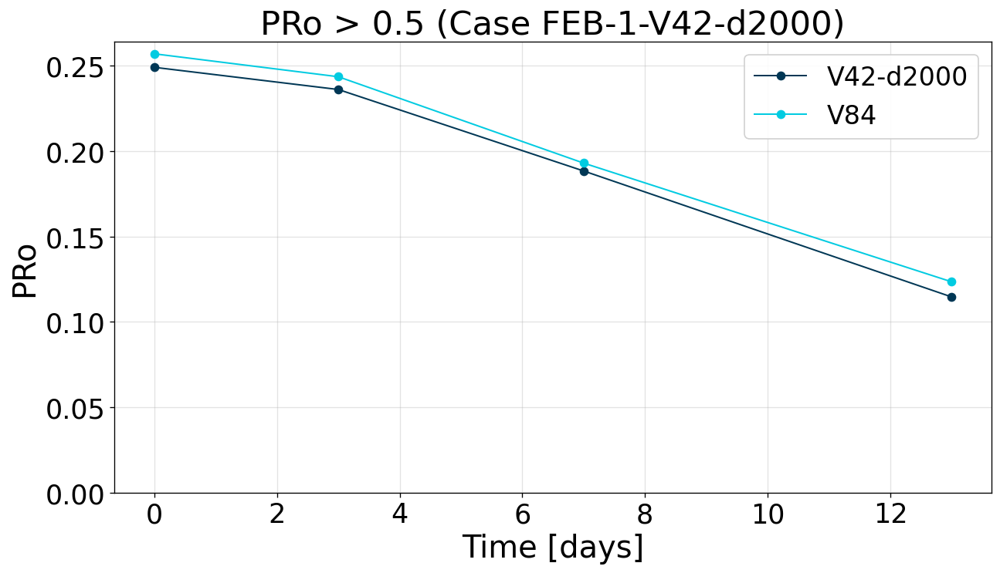

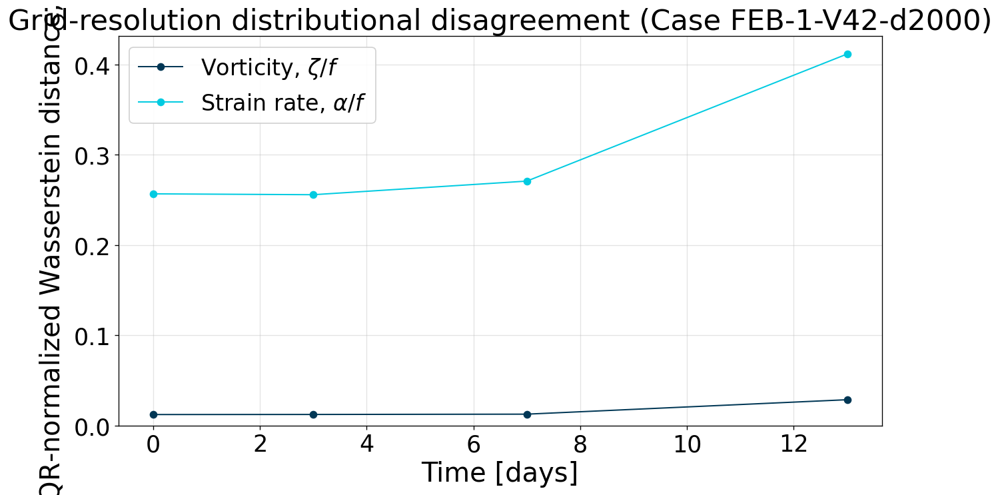

In [15]:
# ============================================================
# 6. METRIC OVERVIEW FIGURES
# ============================================================

apply_comparison_style()

# Shown for inspection only; the values are stored in the selected-snapshot
# NetCDF file and the figure is deliberately not saved.
fig, ax = plt.subplots(figsize=(11.2, 6.6))
ax.plot(
    selected_metrics_df["actual_day_3d"],
    selected_metrics_df["active_fraction_3d"],
    marker="o",
    label=PANEL_LABEL_REFERENCE,
)
ax.plot(
    selected_metrics_df["actual_day_3d"],
    selected_metrics_df["active_fraction_2d"],
    marker="o",
    label=PANEL_LABEL_COMPARISON,
)
ax.set_xlabel("Time [days]")
ax.set_ylabel("PRo")
ax.set_ylim(bottom=0.0)
ax.set_title(
    f"PRo > {shu.format_threshold(ACTIVE_RO_THRESHOLD)} "
    f"({RUN_TITLE_INFO})"
)
ax.legend()
enforce_axis_text_sizes(ax)
fig.tight_layout()
plt.show()


fig, ax = plt.subplots(figsize=(11.2, 6.6))
ax.plot(
    selected_metrics_df["actual_day_3d"],
    selected_metrics_df["vorticity_wasserstein_iqr_normalized"],
    marker="o",
    label=r"Vorticity, $\zeta/f$",
)
ax.plot(
    selected_metrics_df["actual_day_3d"],
    selected_metrics_df["strain_wasserstein_iqr_normalized"],
    marker="o",
    label=r"Strain rate, $\alpha/f$",
)
ax.set_xlabel("Time [days]")
ax.set_ylabel(r"IQR-normalized Wasserstein distance, $W_1^*$")
ax.set_ylim(bottom=0.0)
ax.set_title(f"Grid-resolution distributional disagreement ({RUN_TITLE_INFO})")
ax.legend()
enforce_axis_text_sizes(ax)
fig.tight_layout()

if SAVE_FIGURES:
    fig.savefig(
        FIG_DIR / "selected_case_distribution_distances_snapshots.png",
        dpi=getattr(ptheme, "SAVE_DPI", 300),
        bbox_inches="tight",
        facecolor="white",
        transparent=False,
    )

plt.show()


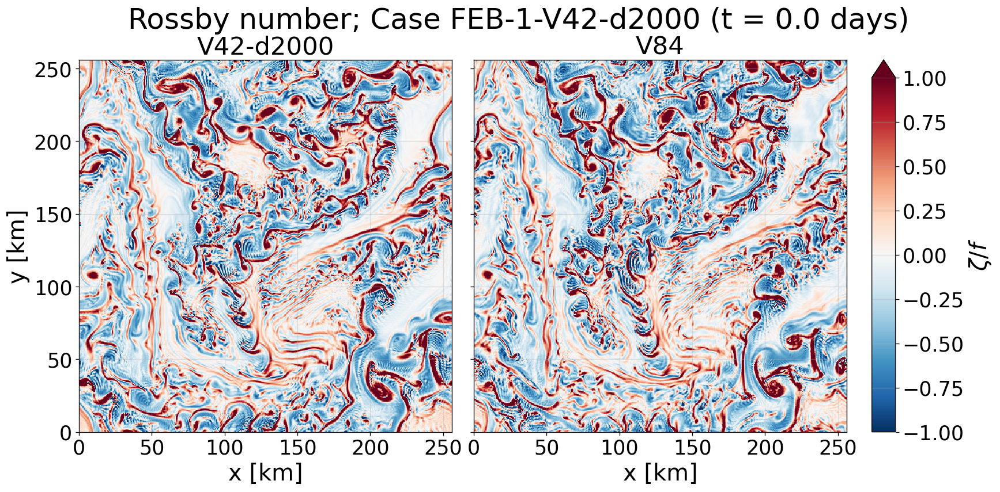

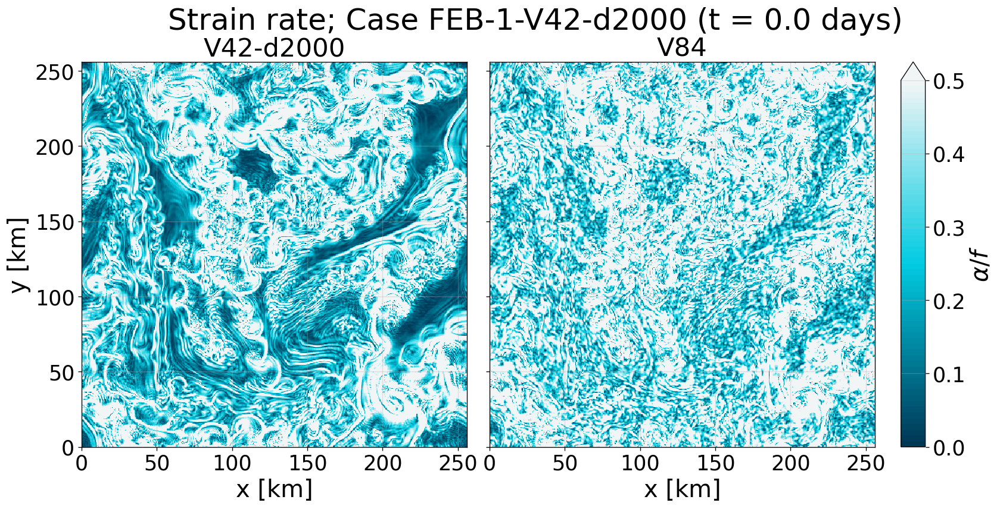

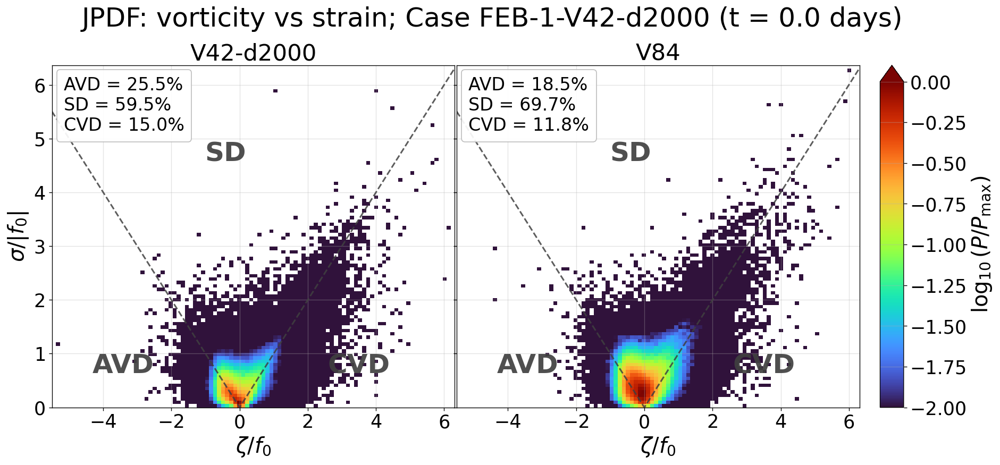

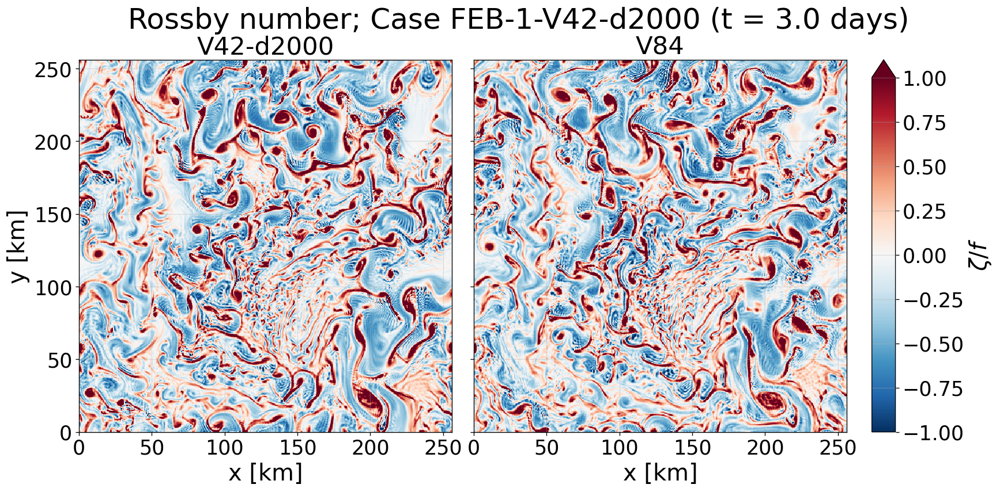

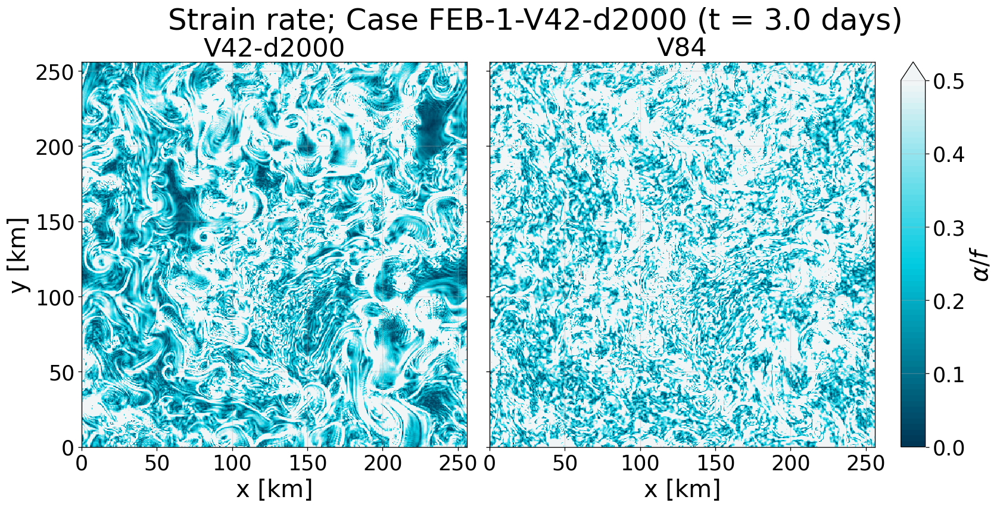

...

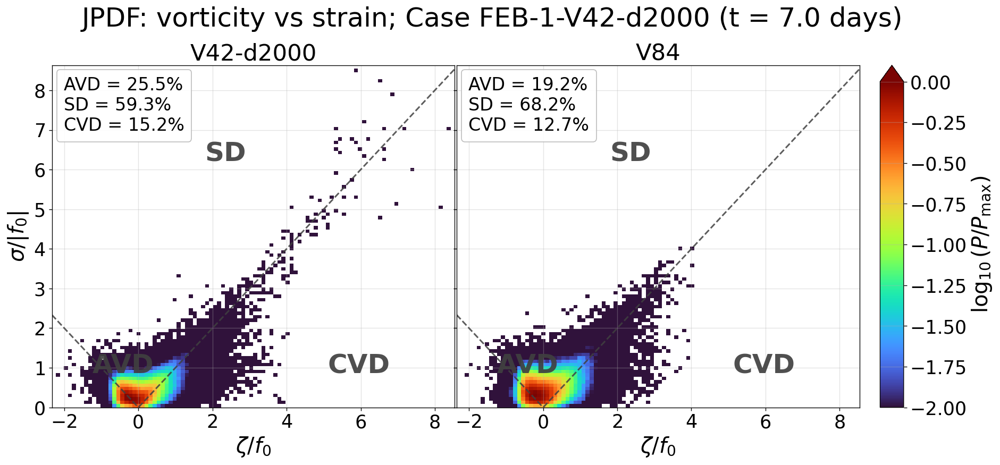

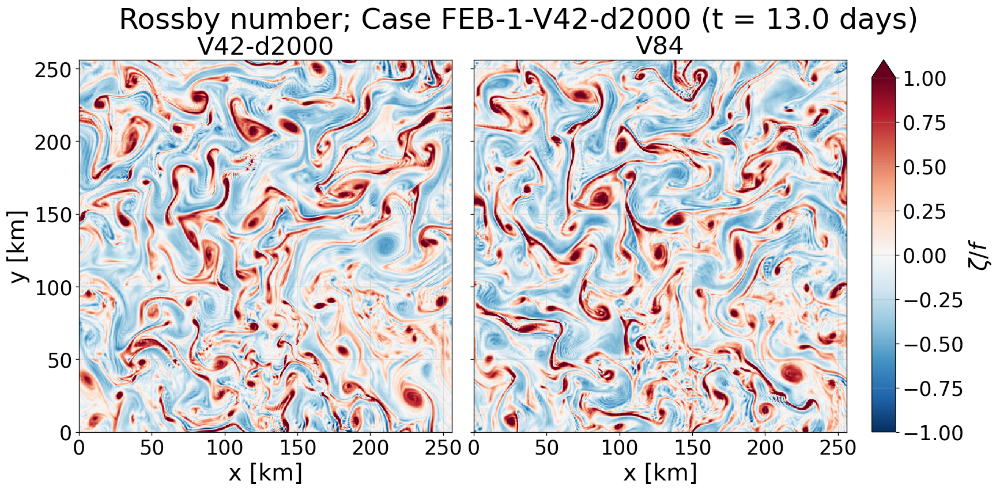

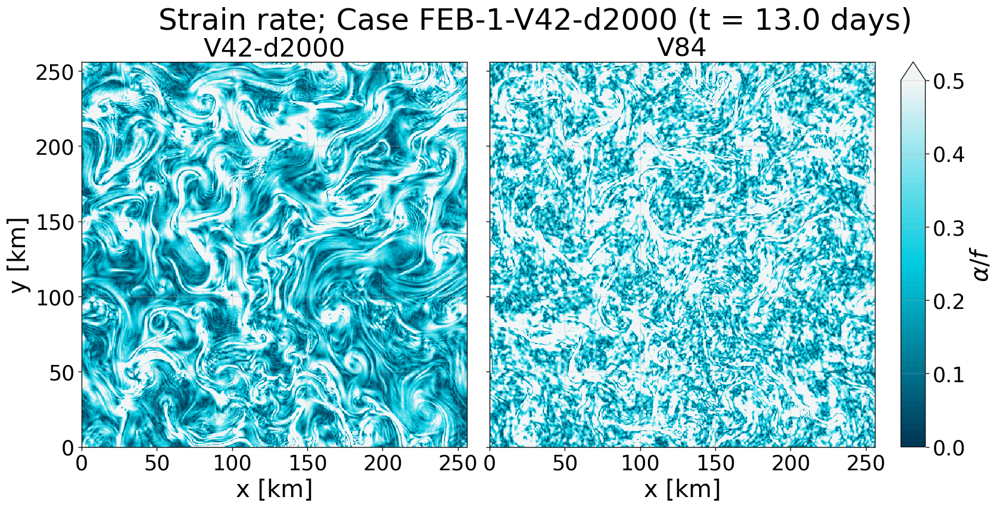

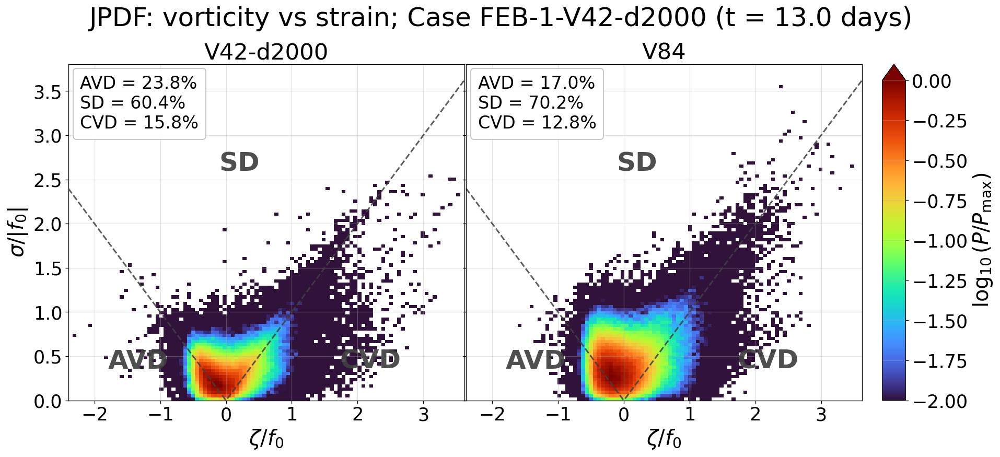

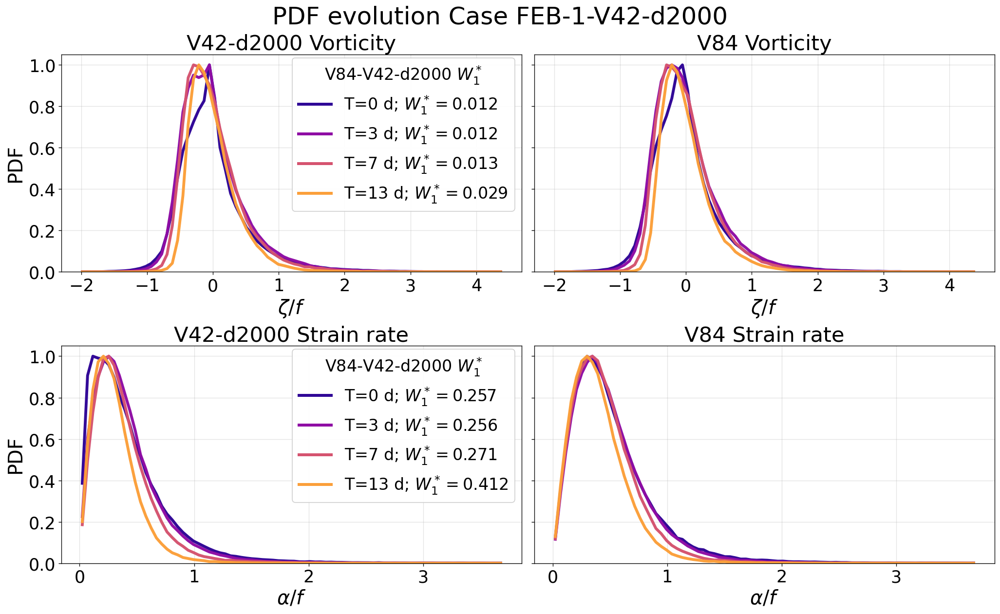

In [16]:
# ============================================================
# 7. SELECTED-SNAPSHOT COMBINED PANELS
# ============================================================

for _, row in selected_metrics_df.iterrows():
    actual_day = float(row["actual_day_3d"])
    snapshot = selected_snapshot_data[actual_day]

    day_tag = safe_filename_day(actual_day)
    obs_index = int(row["obs_index"])

    ro_3d = snapshot["ro_3d"]
    ro_2d = snapshot["ro_2d"]
    strain_3d = snapshot["strain_3d"]
    strain_2d = snapshot["strain_2d"]

    dx_3d = snapshot["dx_3d"]
    dy_3d = snapshot["dy_3d"]
    dx_2d = snapshot["dx_2d"]
    dy_2d = snapshot["dy_2d"]
    label_3d = snapshot["label_3d"]
    label_2d = snapshot["label_2d"]

    if MAKE_SELECTED_CASE_MAPS:
        plot_side_by_side_field_panel(
            ro_3d,
            ro_2d,
            dx_3d=dx_3d,
            dy_3d=dy_3d,
            dx_2d=dx_2d,
            dy_2d=dy_2d,
            title_left=label_3d,
            title_right=label_2d,
            suptitle=(
                f"Rossby number; {RUN_TITLE_INFO} "
                f"(t = {actual_day:.1f} days)"
            ),
            cbar_label=r"$\zeta/f$",
            cmap="rossby",
            vmin=-1.0,
            vmax=1.0,
            output_path=(
                MAP_DIR
                / f"rossby_comparison_obs{obs_index:04d}_T{day_tag}d.png"
                if SAVE_FIGURES
                else None
            ),
        )

        finite_strain_3d = strain_3d[np.isfinite(strain_3d)]
        finite_strain_2d = strain_2d[np.isfinite(strain_2d)]
        combined_strain = np.concatenate(
            [finite_strain_3d.ravel(), finite_strain_2d.ravel()]
        )

        plot_side_by_side_field_panel(
            strain_3d,
            strain_2d,
            dx_3d=dx_3d,
            dy_3d=dy_3d,
            dx_2d=dx_2d,
            dy_2d=dy_2d,
            title_left=label_3d,
            title_right=label_2d,
            suptitle=(
                f"Strain rate; {RUN_TITLE_INFO} "
                f"(t = {actual_day:.1f} days)"
            ),
            cbar_label=r"$\alpha/f$",
            cmap="strain",
            vmin=0.0,
            vmax=0.5,
            output_path=(
                MAP_DIR
                / f"strain_rate_comparison_obs{obs_index:04d}_T{day_tag}d.png"
                if SAVE_FIGURES
                else None
            ),
        )

    if MAKE_SELECTED_CASE_JPDFS:
        plot_combined_jpdf_panel(
            ro_3d=ro_3d,
            strain_3d=strain_3d,
            ro_2d=ro_2d,
            strain_2d=strain_2d,
            title=(
                f"JPDF: vorticity vs strain; {RUN_TITLE_INFO} "
                f"(t = {actual_day:.1f} days)"
            ),
            title_left=label_3d,
            title_right=label_2d,
            output_path=(
                JPDF_DIR
                / f"jpdf_vorticity_strain_obs{obs_index:04d}_T{day_tag}d.png"
                if SAVE_FIGURES
                else None
            ),
        )

if MAKE_SELECTED_CASE_PDF_EVOLUTION:
    plot_pdf_evolution_panel(
        selected_snapshot_data,
        selected_metrics_df,
        title=f"PDF evolution {RUN_TITLE_INFO}",
        title_left=PANEL_LABEL_REFERENCE,
        title_right=PANEL_LABEL_COMPARISON,
        output_path=(
            PDF_EVOLUTION_DIR
            / "pdf_evolution_all_selected_snapshots.png"
            if SAVE_FIGURES
            else None
        ),
    )


In [17]:
# ============================================================
# 8. OUTPUT CHECK
# ============================================================

required_selected_columns = [
    "obs_index",
    "actual_day_3d",
    "active_fraction_3d",
    "active_fraction_2d",
    "vorticity_wasserstein_iqr_normalized",
    "strain_wasserstein_iqr_normalized",
    "divergence_rms_3d",
]

missing_selected = [
    column
    for column in required_selected_columns
    if column not in selected_metrics_df.columns
]

if missing_selected:
    raise RuntimeError(
        f"Missing selected-case output columns: {missing_selected}"
    )

print("Selected grid-resolution snapshots:")
display(selected_metrics_df[required_selected_columns])

if SAVE_OUTPUTS:
    print(f"Saved activity dataset: {SELECTED_ACTIVITY_FILE}")

print(f"Saved figures inside case folder: {FIG_DIR}")
print("Done.")


Selected grid-resolution snapshots:


,obs_index,actual_day_3d,active_fraction_3d,active_fraction_2d,vorticity_wasserstein_iqr_normalized,strain_wasserstein_iqr_normalized,divergence_rms_3d
0,0,0.0,0.249092,0.257011,0.012133,0.256654,0.136095
1,24,3.0,0.236099,0.243580,0.012221,0.255703,0.111054
2,56,7.0,0.188374,0.192986,0.012555,0.270774,0.093630
3,104,13.0,0.114590,0.123444,0.028562,0.411587,0.072301


Saved activity dataset: C:\Users\Jelle Gortemaker\Documents\Thesis\z.flow_postprocessing\results\run_feb1_v42_d2000\metrics\submesoscale_activity_grid_resolution_selected_snapshots.nc
Saved figures inside case folder: C:\Users\Jelle Gortemaker\Documents\Thesis\z.flow_postprocessing\results\run_feb1_v42_d2000\figures\variable_discretization_comparison
Done.


In [18]:
# # ============================================================
# # COMPARISON SNAPSHOTS + JPDF MOVIE
# #
# # Saves:
# #   1. strain-rate comparison frames
# #   2. vorticity-strain JPDF comparison frames
# #
# # PDF-evolution frames are intentionally omitted.
# # ============================================================


# MAKE_COMPARISON_SNAPSHOTS = True
# MAKE_JPDF_MOVIE = False

# # None means all timesteps available in both files.
# COMPARISON_TIME_INDICES = None

# # Examples:
# # COMPARISON_TIME_INDICES = range(0, 10)
# # COMPARISON_TIME_INDICES = range(0, 160, 2)

# OVERWRITE_EXISTING_FRAMES = False

# # Lower than print DPI because these are animation frames.
# FRAME_DPI = 120

# # Movie playback speed.
# # Increase this if you want the JPDF evolution to play faster.
# JPDF_MOVIE_FPS = 12


# # ------------------------------------------------------------
# # OUTPUT DIRECTORY
# # ------------------------------------------------------------

# if MAKE_COMPARISON_SNAPSHOTS:
#     COMPARISON_FRAME_DIR = (
#         Path.home()
#         / "Downloads"
#         / f"{CASE_REFERENCE}_grid_resolution_animation_frames"
#     )

#     COMPARISON_FRAME_DIR.mkdir(
#         parents=True,
#         exist_ok=True,
#     )

#     JPDF_MOVIE_PATH = (
#         COMPARISON_FRAME_DIR
#         / f"{CASE_REFERENCE}_jpdf_evolution.mp4"
#     )


# # ------------------------------------------------------------
# # STYLE WITHOUT RE-REGISTERING COLORMAPS
# # ------------------------------------------------------------

# def apply_comparison_style():
#     font_size = max(
#         getattr(ptheme, "FONT_SIZE", 14),
#         20,
#     )

#     title_size = max(
#         getattr(ptheme, "TITLE_SIZE", font_size + 2),
#         26,
#     )

#     label_size = max(
#         getattr(ptheme, "LABEL_SIZE", font_size),
#         24,
#     )

#     tick_size = max(
#         getattr(ptheme, "TICK_SIZE", font_size - 2),
#         21,
#     )

#     legend_size = max(
#         getattr(ptheme, "LEGEND_SIZE", font_size - 1),
#         20,
#     )

#     annotation_size = max(
#         getattr(ptheme, "ANNOTATION_SIZE", font_size - 2),
#         19,
#     )

#     suptitle_size = max(
#         getattr(ptheme, "SUPTITLE_SIZE", title_size + 2),
#         30,
#     )

#     plt.rcParams.update({
#         "font.size": font_size,
#         "axes.titlesize": title_size,
#         "axes.labelsize": label_size,
#         "xtick.labelsize": tick_size,
#         "ytick.labelsize": tick_size,
#         "legend.fontsize": legend_size,
#         "figure.titlesize": suptitle_size,
#     })

#     return {
#         "font": font_size,
#         "title": title_size,
#         "label": label_size,
#         "tick": tick_size,
#         "legend": legend_size,
#         "annotation": annotation_size,
#         "suptitle": suptitle_size,
#     }


# PLOT_SIZES = apply_comparison_style()


# # ------------------------------------------------------------
# # SAVE CURRENT FIGURE AND IMMEDIATELY CLOSE IT
# # ------------------------------------------------------------

# def save_current_figure(output_path):
#     fig = plt.gcf()

#     fig.savefig(
#         output_path,
#         dpi=FRAME_DPI,
#         facecolor="white",
#         transparent=False,
#     )

#     fig.clear()
#     plt.close(fig)


# # ------------------------------------------------------------
# # JPDF ANIMATION HELPERS
# # ------------------------------------------------------------

# REGIME_LABEL_NAMES = {"AVD", "SD", "CVD"}


# def capture_regime_label_positions(ax):
#     """
#     Record the AVD / SD / CVD positions in axes coordinates.

#     The original plotting routine places these labels in data coordinates.
#     Converting the first frame to axes coordinates allows exactly the same
#     visual locations to be reused in every movie frame.
#     """
#     positions = {}

#     for text_artist in ax.texts:
#         label = text_artist.get_text()

#         if label not in REGIME_LABEL_NAMES:
#             continue

#         # Existing text position -> display coordinates.
#         display_xy = text_artist.get_transform().transform(
#             text_artist.get_position()
#         )

#         # Display coordinates -> axes-fraction coordinates.
#         axes_xy = ax.transAxes.inverted().transform(display_xy)

#         positions[label] = (
#             float(axes_xy[0]),
#             float(axes_xy[1]),
#         )

#     return positions


# def pin_regime_label_positions(ax, positions):
#     """
#     Force AVD / SD / CVD to the same axes-relative positions
#     used in the reference JPDF frame.
#     """
#     for text_artist in ax.texts:
#         label = text_artist.get_text()

#         if label not in positions:
#             continue

#         text_artist.set_transform(ax.transAxes)
#         text_artist.set_position(positions[label])


# def extend_jpdf_diagonal_to_fixed_limits(ax):
#     """
#     Make the dashed strain/vorticity boundary span the fixed
#     JPDF x-axis limits in every frame.

#     This prevents the dashed line itself from appearing to change
#     length when the timestep-specific JPDF edges change.
#     """
#     x_limits = ax.get_xlim()
#     x_line = np.linspace(
#         x_limits[0],
#         x_limits[1],
#         500,
#     )

#     for line in ax.lines:
#         if line.get_linestyle() == "--":
#             line.set_data(
#                 x_line,
#                 np.abs(x_line),
#             )
#             break


# def _pad_movie_frame_to_even_size(frame):
#     """
#     H.264/yuv420p requires even image dimensions.
#     Usually the saved frames are already even-sized, but this
#     keeps movie creation robust if the figure dimensions change.
#     """
#     frame = np.asarray(frame)

#     height, width = frame.shape[:2]

#     pad_height = height % 2
#     pad_width = width % 2

#     if pad_height == 0 and pad_width == 0:
#         return frame

#     if frame.ndim == 3:
#         padding = (
#             (0, pad_height),
#             (0, pad_width),
#             (0, 0),
#         )
#     else:
#         padding = (
#             (0, pad_height),
#             (0, pad_width),
#         )

#     return np.pad(
#         frame,
#         padding,
#         mode="edge",
#     )


# def create_jpdf_movie(
#     frame_paths,
#     output_path,
#     fps=12,
# ):
#     """
#     Assemble the saved JPDF PNGs into an MP4.

#     Frames are streamed one at a time, so the complete animation
#     does not need to be loaded into memory.
#     """
#     try:
#         import imageio.v2 as imageio
#     except ImportError as exc:
#         raise ImportError(
#             "Creating the MP4 requires 'imageio'. "
#             "Install imageio and imageio-ffmpeg in this environment."
#         ) from exc

#     frame_paths = [
#         Path(path)
#         for path in frame_paths
#         if Path(path).exists()
#     ]

#     if not frame_paths:
#         raise FileNotFoundError(
#             "No JPDF frames were found for movie creation."
#         )

#     print()
#     print(
#         f"Creating JPDF movie from "
#         f"{len(frame_paths)} frames..."
#     )

#     with imageio.get_writer(
#         str(output_path),
#         fps=float(fps),
#         codec="libx264",
#         quality=8,
#         pixelformat="yuv420p",
#         macro_block_size=None,
#     ) as writer:

#         for frame_number, frame_path in enumerate(
#             frame_paths,
#             start=1,
#         ):
#             frame = imageio.imread(frame_path)

#             frame = _pad_movie_frame_to_even_size(
#                 frame
#             )

#             writer.append_data(frame)

#             if (
#                 frame_number == 1
#                 or frame_number % 25 == 0
#                 or frame_number == len(frame_paths)
#             ):
#                 print(
#                     f"Movie frame "
#                     f"{frame_number}/{len(frame_paths)}"
#                 )

#     print(f"Saved JPDF movie: {output_path}")


# # ------------------------------------------------------------
# # EXPORT LOOP
# # ------------------------------------------------------------

# jpdf_movie_frame_paths = []

# if MAKE_COMPARISON_SNAPSHOTS:

#     if not DATA_FILE_3D.exists():
#         raise FileNotFoundError(DATA_FILE_3D)

#     if not DATA_FILE_2D.exists():
#         raise FileNotFoundError(DATA_FILE_2D)

#     config_3d_frames = optional_case_config(
#         CASE_3D
#     )

#     config_2d_frames = optional_case_config(
#         CASE_2D
#     )

#     reference_index_3d_frames = resolve_reference_index(
#         config_3d_frames,
#         REFERENCE_START_INDEX_3D,
#     )

#     reference_index_2d_frames = resolve_reference_index(
#         config_2d_frames,
#         REFERENCE_START_INDEX_2D,
#     )

#     # Existing plotting functions call plt.show().
#     # Suppress notebook display while exporting.
#     original_show = plt.show
#     original_interactive = plt.isinteractive()

#     plt.show = lambda *args, **kwargs: None
#     plt.ioff()

#     try:

#         with xr.open_dataset(
#             DATA_FILE_3D,
#             decode_times=False,
#             cache=False,
#         ) as ds_3d_frames, xr.open_dataset(
#             DATA_FILE_2D,
#             decode_times=False,
#             cache=False,
#         ) as ds_2d_frames:

#             # --------------------------------------------
#             # DATASET LAYOUT
#             # --------------------------------------------

#             (
#                 time_dim_3d_frames,
#                 z_dim_3d_frames,
#             ) = dataset_layout(
#                 ds_3d_frames
#             )

#             (
#                 time_dim_2d_frames,
#                 z_dim_2d_frames,
#             ) = dataset_layout(
#                 ds_2d_frames
#             )

#             dx_3d_frames = infer_grid_spacing(
#                 ds_3d_frames,
#                 "X",
#                 fallback=DX_3D,
#             )

#             dy_3d_frames = infer_grid_spacing(
#                 ds_3d_frames,
#                 "Y",
#                 fallback=DY_3D,
#             )

#             dx_2d_frames = infer_grid_spacing(
#                 ds_2d_frames,
#                 "X",
#                 fallback=DX_2D,
#             )

#             dy_2d_frames = infer_grid_spacing(
#                 ds_2d_frames,
#                 "Y",
#                 fallback=DY_2D,
#             )

#             nt_3d_frames = ds_3d_frames.sizes[
#                 time_dim_3d_frames
#             ]

#             nt_2d_frames = ds_2d_frames.sizes[
#                 time_dim_2d_frames
#             ]

#             nt_common = min(
#                 nt_3d_frames,
#                 nt_2d_frames,
#             )

#             time_days_3d_frames = elapsed_days(
#                 nt_3d_frames,
#                 DAY_PER_INDEX_3D,
#                 reference_index_3d_frames,
#             )

#             time_days_2d_frames = elapsed_days(
#                 nt_2d_frames,
#                 DAY_PER_INDEX_2D,
#                 reference_index_2d_frames,
#             )

#             if COMPARISON_TIME_INDICES is None:
#                 comparison_time_indices = list(
#                     range(nt_common)
#                 )
#             else:
#                 comparison_time_indices = [
#                     int(index)
#                     for index in COMPARISON_TIME_INDICES
#                 ]

#             invalid_indices = [
#                 index
#                 for index in comparison_time_indices
#                 if index < 0 or index >= nt_common
#             ]

#             if invalid_indices:
#                 raise IndexError(
#                     "COMPARISON_TIME_INDICES contains indices "
#                     f"outside 0 to {nt_common - 1}: "
#                     f"{invalid_indices}"
#                 )

#             number_of_frames = len(
#                 comparison_time_indices
#             )

#             print(
#                 f"Saving frames to: "
#                 f"{COMPARISON_FRAME_DIR}"
#             )

#             print(
#                 f"Number of frames: "
#                 f"{number_of_frames}"
#             )

#             # --------------------------------------------
#             # JPDF REFERENCE GEOMETRY
#             #
#             # These are established using the first selected
#             # JPDF and reused for all subsequent frames.
#             # --------------------------------------------

#             jpdf_reference_figsize = None
#             jpdf_reference_limits = None
#             jpdf_reference_label_positions = None

#             # --------------------------------------------
#             # TIMESTEP LOOP
#             # --------------------------------------------

#             for frame_number, it in enumerate(
#                 comparison_time_indices,
#                 start=1,
#             ):

#                 strain_path = (
#                     COMPARISON_FRAME_DIR
#                     / f"strain_rate_t{it:04d}.png"
#                 )

#                 jpdf_path = (
#                     COMPARISON_FRAME_DIR
#                     / (
#                         "jpdf_vorticity_strain_"
#                         f"t{it:04d}.png"
#                     )
#                 )

#                 # Store exact selected frame sequence for MP4.
#                 jpdf_movie_frame_paths.append(
#                     jpdf_path
#                 )

#                 # The first JPDF must always be opened once,
#                 # even if the PNG already exists, because it
#                 # defines the fixed limits/label positions.
#                 if (
#                     not OVERWRITE_EXISTING_FRAMES
#                     and strain_path.exists()
#                     and jpdf_path.exists()
#                     and jpdf_reference_limits is not None
#                 ):
#                     continue

#                 actual_day_3d = float(
#                     time_days_3d_frames[it]
#                 )

#                 actual_day_2d = float(
#                     time_days_2d_frames[it]
#                 )

#                 # --------------------------------------------
#                 # CURRENT TIMESTEP CALCULATION
#                 # --------------------------------------------

#                 diagnostics_3d = calculate_kinematics(
#                     ds_3d_frames,
#                     time_dim_3d_frames,
#                     z_dim_3d_frames,
#                     it,
#                     LEVEL_INDICES_3D,
#                     dx_3d_frames,
#                     dy_3d_frames,
#                 )

#                 diagnostics_2d = calculate_kinematics(
#                     ds_2d_frames,
#                     time_dim_2d_frames,
#                     z_dim_2d_frames,
#                     it,
#                     LEVEL_INDICES_2D,
#                     dx_2d_frames,
#                     dy_2d_frames,
#                 )

#                 ro_3d = diagnostics_3d["ro"]
#                 ro_2d = diagnostics_2d["ro"]

#                 strain_3d = diagnostics_3d[
#                     "strain_f"
#                 ]

#                 strain_2d = diagnostics_2d[
#                     "strain_f"
#                 ]

#                 # --------------------------------------------
#                 # STRAIN-RATE FRAME
#                 # --------------------------------------------

#                 if (
#                     OVERWRITE_EXISTING_FRAMES
#                     or not strain_path.exists()
#                 ):

#                     plot_side_by_side_field_panel(
#                         strain_3d,
#                         strain_2d,
#                         dx_3d=dx_3d_frames,
#                         dy_3d=dy_3d_frames,
#                         dx_2d=dx_2d_frames,
#                         dy_2d=dy_2d_frames,
#                         title_left=label_3d,
#                         title_right=label_2d,
#                         suptitle=(
#                             f"Strain rate; "
#                             f"{RUN_TITLE_INFO} "
#                             f"(t = "
#                             f"{actual_day_3d:06.3f} days)"
#                         ),
#                         cbar_label=r"$\alpha/f$",
#                         cmap="strain",
#                         vmin=0.0,
#                         vmax=0.5,
#                         output_path=None,
#                     )

#                     save_current_figure(
#                         strain_path
#                     )

#                 # --------------------------------------------
#                 # JPDF FRAME
#                 # --------------------------------------------

#                 jpdf_needs_saving = (
#                     OVERWRITE_EXISTING_FRAMES
#                     or not jpdf_path.exists()
#                 )

#                 if (
#                     jpdf_needs_saving
#                     or jpdf_reference_limits is None
#                 ):

#                     plot_combined_jpdf_panel(
#                         ro_3d=ro_3d,
#                         strain_3d=strain_3d,
#                         ro_2d=ro_2d,
#                         strain_2d=strain_2d,
#                         title=(
#                             "JPDF: vorticity vs strain; "
#                             f"{RUN_TITLE_INFO} "
#                             f"(t = "
#                             f"{actual_day_3d:06.3f} days)"
#                         ),
#                         title_left=label_3d,
#                         title_right=label_2d,
#                         output_path=None,
#                     )

#                     jpdf_fig = plt.gcf()

#                     # First two axes are the 3D/reference and
#                     # 2D/comparison JPDF panels.
#                     jpdf_axes = jpdf_fig.axes[:2]

#                     # ----------------------------------------
#                     # FIRST JPDF:
#                     # capture geometry and label positions
#                     # ----------------------------------------

#                     if jpdf_reference_limits is None:

#                         jpdf_reference_figsize = (
#                             jpdf_fig
#                             .get_size_inches()
#                             .copy()
#                         )

#                         jpdf_reference_limits = [
#                             (
#                                 tuple(axis.get_xlim()),
#                                 tuple(axis.get_ylim()),
#                             )
#                             for axis in jpdf_axes
#                         ]

#                         jpdf_reference_label_positions = [
#                             capture_regime_label_positions(
#                                 axis
#                             )
#                             for axis in jpdf_axes
#                         ]

#                     # ----------------------------------------
#                     # ALL JPDFs:
#                     # enforce exactly the same geometry
#                     # ----------------------------------------

#                     jpdf_fig.set_size_inches(
#                         jpdf_reference_figsize,
#                         forward=True,
#                     )

#                     for (
#                         axis,
#                         limits,
#                         label_positions,
#                     ) in zip(
#                         jpdf_axes,
#                         jpdf_reference_limits,
#                         jpdf_reference_label_positions,
#                     ):

#                         x_limits, y_limits = limits

#                         # Fixed scales.
#                         axis.set_xlim(
#                             x_limits
#                         )
#                         axis.set_ylim(
#                             y_limits
#                         )

#                         # Fixed AVD / SD / CVD locations.
#                         pin_regime_label_positions(
#                             axis,
#                             label_positions,
#                         )

#                         # Fixed visual extent of the
#                         # sigma = |zeta| boundaries.
#                         extend_jpdf_diagonal_to_fixed_limits(
#                             axis
#                         )

#                     if jpdf_needs_saving:
#                         save_current_figure(
#                             jpdf_path
#                         )
#                     else:
#                         jpdf_fig.clear()
#                         plt.close(jpdf_fig)

#                 # --------------------------------------------
#                 # RELEASE CURRENT TIMESTEP
#                 # --------------------------------------------

#                 del diagnostics_3d
#                 del diagnostics_2d
#                 del ro_3d
#                 del ro_2d
#                 del strain_3d
#                 del strain_2d

#                 plt.close("all")

#                 if (
#                     frame_number == 1
#                     or frame_number % 10 == 0
#                     or frame_number == number_of_frames
#                 ):
#                     print(
#                         f"Processed frame {it:04d}: "
#                         f"reference="
#                         f"{actual_day_3d:g} days, "
#                         f"comparison="
#                         f"{actual_day_2d:g} days"
#                     )

#     finally:

#         plt.show = original_show
#         plt.close("all")

#         if original_interactive:
#             plt.ion()
#         else:
#             plt.ioff()

#     print(
#         "Finished saving comparison frames."
#     )


# # ------------------------------------------------------------
# # CREATE JPDF MOVIE
# # ------------------------------------------------------------

# if (
#     MAKE_COMPARISON_SNAPSHOTS
#     and MAKE_JPDF_MOVIE
# ):

#     missing_jpdf_frames = [
#         path
#         for path in jpdf_movie_frame_paths
#         if not Path(path).exists()
#     ]

#     if missing_jpdf_frames:
#         raise FileNotFoundError(
#             "Cannot create JPDF movie because "
#             f"{len(missing_jpdf_frames)} expected "
#             "JPDF frame(s) are missing. "
#             f"First missing frame: "
#             f"{missing_jpdf_frames[0]}"
#         )

#     create_jpdf_movie(
#         frame_paths=jpdf_movie_frame_paths,
#         output_path=JPDF_MOVIE_PATH,
#         fps=JPDF_MOVIE_FPS,
#     )